In [80]:
!pip install python-whois

In [81]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from colorama import Fore
from urllib.parse import urlparse
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [82]:

import socket
import whois
from datetime import datetime
import time
from bs4 import BeautifulSoup
import urllib
import bs4
import random
import math

In [83]:
from sklearn.metrics import mean_squared_error,confusion_matrix, precision_score, recall_score, auc,roc_curve
from sklearn.model_selection import train_test_split

In [84]:

from collections import Counter
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score


In [85]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


In [86]:
import xgboost as xgb
#from lightgbm import LGBMClassifier
#from xgboost import XGBClassifier

In [87]:
data = pd.read_csv('D:\\Thesis\\Ms thesis\\Research Cell\\URL paper\\Dataset\malicious_phish.csv')
data.head()

,url,type
0,br-icloud.com.br,phishing
1,mp3raid.com/music/krizz_kaliko.html,benign
2,bopsecrets.org/rexroth/cr/1.htm,benign
3,http://www.garage-pirenne.be/index.php?option=...,defacement
4,http://adventure-nicaragua.net/index.php?optio...,defacement


# Meta information of Dataframe

In [88]:
print(data.shape)


(651191, 2)


In [89]:
count=data.type.value_counts()
count

type
benign        428103
defacement     96457
phishing       94111
malware        32520
Name: count, dtype: int64

In [90]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 651191 entries, 0 to 651190
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   url     651191 non-null  object
 1   type    651191 non-null  object
dtypes: object(2)
memory usage: 9.9+ MB


In [91]:
data.isnull().sum()

url     0
type    0
dtype: int64

In [92]:
data.duplicated().sum()

10066

In [93]:
data.drop_duplicates(inplace=True)

In [94]:
data.duplicated().sum()

0

In [95]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 641125 entries, 0 to 651190
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   url     641125 non-null  object
 1   type    641125 non-null  object
dtypes: object(2)
memory usage: 14.7+ MB


In [96]:
import re
import string
import logging

In [97]:
from tldextract import extract as tld_extract
from tld import get_tld, is_tld
from tld.exceptions import TldDomainNotFound, TldBadUrl, TldIOError

from colorama import Fore
from datetime import datetime
from plotly.subplots import make_subplots
from plotly import graph_objects as go
from wordcloud import WordCloud
from gensim.models import Word2Vec
import tldextract
import hashlib
import whois
import warnings

warnings.filterwarnings("ignore")

In [98]:
count = data["type"].value_counts()

colors = ['#FF6633', '#FFB399', '#FF33FF', '#FFFF99', '#00B3E6',
    '#E6B333', '#3366E6', '#999966', '#99FF99', '#B34D4D']

fig = go.Figure(data=[go.Bar(x=count.index, y=count, marker=dict(color=colors))])
fig.update_layout(
    xaxis_title='Types',
    yaxis_title='Count',
    title='Count of Different Types of URLs',
    plot_bgcolor='black',
    paper_bgcolor='black',
    font=dict(color='white')
)
fig.update_xaxes(tickfont=dict(color='white'))
fig.update_yaxes(tickfont=dict(color='white'))
fig.show()

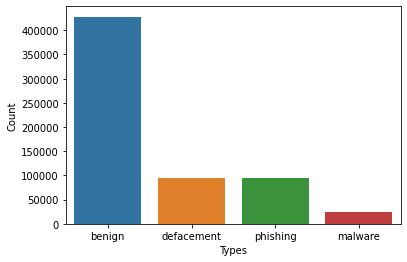

In [99]:
sns.barplot(x=count.index, y=count)
plt.xlabel('Types')
plt.ylabel('Count');

In [100]:
data["type"].value_counts()

type
benign        428080
defacement     95308
phishing       94092
malware        23645
Name: count, dtype: int64

In [101]:
data["url_type"] = data["type"].replace({
    'benign':0,
    'defacement':1,
    'phishing':2,
    'malware':3
});

In [102]:
data

,url,type,url_type
0,br-icloud.com.br,phishing,2
1,mp3raid.com/music/krizz_kaliko.html,benign,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0
3,http://www.garage-pirenne.be/index.php?option=...,defacement,1
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1
...,...,...,...
651186,xbox360.ign.com/objects/850/850402.html,phishing,2
651187,games.teamxbox.com/xbox-360/1860/Dead-Space/,phishing,2
651188,www.gamespot.com/xbox360/action/deadspace/,phishing,2
651189,en.wikipedia.org/wiki/Dead_Space_(video_game),phishing,2


first have to omit the (www.) from the URL which is in fact a sub domain in itself.

In [103]:
data['url'] = data['url'].replace('www.', '', regex=True)
data

,url,type,url_type
0,br-icloud.com.br,phishing,2
1,mp3raid.com/music/krizz_kaliko.html,benign,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1
...,...,...,...
651186,xbox360.ign.com/objects/850/850402.html,phishing,2
651187,games.teamxbox.com/xbox-360/1860/Dead-Space/,phishing,2
651188,gamespot.com/xbox360/action/deadspace/,phishing,2
651189,en.wikipedia.org/wiki/Dead_Space_(video_game),phishing,2


In [104]:
data.head()

,url,type,url_type
0,br-icloud.com.br,phishing,2
1,mp3raid.com/music/krizz_kaliko.html,benign,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1


# Feature Extraction

In [105]:
import re
#Use of IP or not in domain
def having_ip_address(url):
    match = re.search(
        '(([01]?\\d\\d?|2[0-4]\\d|25[0-5])\\.([01]?\\d\\d?|2[0-4]\\d|25[0-5])\\.([01]?\\d\\d?|2[0-4]\\d|25[0-5])\\.'
        '([01]?\\d\\d?|2[0-4]\\d|25[0-5])\\/)|'  # IPv4
        '((0x[0-9a-fA-F]{1,2})\\.(0x[0-9a-fA-F]{1,2})\\.(0x[0-9a-fA-F]{1,2})\\.(0x[0-9a-fA-F]{1,2})\\/)' # IPv4 in hexadecimal
        '(?:[a-fA-F0-9]{1,4}:){7}[a-fA-F0-9]{1,4}', url)  # Ipv6
    if match:
        # print match.group()
        return 1
    else:
        # print 'No matching pattern found'
        return 0
data['use_of_ip'] = data['url'].apply(lambda i: having_ip_address(i))

In [106]:
from urllib.parse import urlparse




def abnormal_url(url):
    hostname = urlparse(url).hostname
    hostname = str(hostname)
    match = re.search(hostname, url)
    if match:
        # print match.group()
        return 1
    else:
        # print 'No matching pattern found'
        return 0


data['abnormal_url'] = data['url'].apply(lambda i: abnormal_url(i))

In [107]:
from googlesearch import search
def google_index(url):
    site = search(url, 5)
    return 1 if site else 0
data['google_index'] = data['url'].apply(lambda i: google_index(i))

In [108]:
data['count.'] = data['url'].apply(lambda i: i.count('.'))
data.head()

,url,type,url_type,use_of_ip,abnormal_url,google_index,count.
0,br-icloud.com.br,phishing,2,0,0,1,2
1,mp3raid.com/music/krizz_kaliko.html,benign,0,0,0,1,2
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,0,0,1,2
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,0,1,1,2
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,0,1,1,2


In [109]:
data

,url,type,url_type,use_of_ip,abnormal_url,google_index,count.
0,br-icloud.com.br,phishing,2,0,0,1,2
1,mp3raid.com/music/krizz_kaliko.html,benign,0,0,0,1,2
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,0,0,1,2
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,0,1,1,2
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,0,1,1,2
...,...,...,...,...,...,...,...
651186,xbox360.ign.com/objects/850/850402.html,phishing,2,0,0,1,3
651187,games.teamxbox.com/xbox-360/1860/Dead-Space/,phishing,2,0,0,1,2
651188,gamespot.com/xbox360/action/deadspace/,phishing,2,0,0,1,1
651189,en.wikipedia.org/wiki/Dead_Space_(video_game),phishing,2,0,0,1,2


In [110]:
data['count-www'] = data['url'].apply(lambda i: i.count('www'))
data['count@'] = data['url'].apply(lambda i: i.count('@'))
from urllib.parse import urlparse
def no_of_dir(url):
    urldir = urlparse(url).path
    return urldir.count('/')
data['count_dir'] = data['url'].apply(lambda i: no_of_dir(i))
def no_of_embed(url):
    urldir = urlparse(url).path
    return urldir.count('//')
data['count_embed_domian'] = data['url'].apply(lambda i: no_of_embed(i))
def shortening_service(url):
    match = re.search('bit\.ly|goo\.gl|shorte\.st|go2l\.ink|x\.co|ow\.ly|t\.co|tinyurl|tr\.im|is\.gd|cli\.gs|'
                      'yfrog\.com|migre\.me|ff\.im|tiny\.cc|url4\.eu|twit\.ac|su\.pr|twurl\.nl|snipurl\.com|'
                      'short\.to|BudURL\.com|ping\.fm|post\.ly|Just\.as|bkite\.com|snipr\.com|fic\.kr|loopt\.us|'
                      'doiop\.com|short\.ie|kl\.am|wp\.me|rubyurl\.com|om\.ly|to\.ly|bit\.do|t\.co|lnkd\.in|'
                      'db\.tt|qr\.ae|adf\.ly|goo\.gl|bitly\.com|cur\.lv|tinyurl\.com|ow\.ly|bit\.ly|ity\.im|'
                      'q\.gs|is\.gd|po\.st|bc\.vc|twitthis\.com|u\.to|j\.mp|buzurl\.com|cutt\.us|u\.bb|yourls\.org|'
                      'x\.co|prettylinkpro\.com|scrnch\.me|filoops\.info|vzturl\.com|qr\.net|1url\.com|tweez\.me|v\.gd|'
                      'tr\.im|link\.zip\.net',
                      url)
    if match:
        return 1
    else:
        return 0
data['short_url'] = data['url'].apply(lambda i: shortening_service(i))

In [111]:
data['count-https'] = data['url'].apply(lambda i : i.count('https'))
data['count-http'] = data['url'].apply(lambda i : i.count('http'))

In [112]:
data['count%'] = data['url'].apply(lambda i: i.count('%'))
data['count?'] = data['url'].apply(lambda i: i.count('?'))
data['count-'] = data['url'].apply(lambda i: i.count('-'))
data['count='] = data['url'].apply(lambda i: i.count('='))
#Length of URL
data['url_length'] = data['url'].apply(lambda i: len(str(i)))
#Hostname Length
data['hostname_length'] = data['url'].apply(lambda i: len(urlparse(i).netloc))

data.head()

,url,type,url_type,use_of_ip,abnormal_url,google_index,count.,count-www,count@,count_dir,count_embed_domian,short_url,count-https,count-http,count%,count?,count-,count=,url_length,hostname_length
0,br-icloud.com.br,phishing,2,0,0,1,2,0,0,0,0,0,0,0,0,0,1,0,16,0
1,mp3raid.com/music/krizz_kaliko.html,benign,0,0,0,1,2,0,0,2,0,0,0,0,0,0,0,0,35,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,0,0,1,2,0,0,3,0,0,0,0,0,0,0,0,31,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,0,1,1,2,0,0,1,0,0,0,1,0,1,1,4,84,17
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,0,1,1,2,0,0,1,0,0,0,1,0,1,1,3,235,23


In [113]:
def suspicious_words(url):
    match = re.search('PayPal|login|signin|bank|account|update|free|lucky|service|bonus|ebayisapi|webscr',
                      url)
    if match:
        return 1
    else:
        return 0
data['sus_url'] = data['url'].apply(lambda i: suspicious_words(i))

In [114]:
data.head()

,url,type,url_type,use_of_ip,abnormal_url,google_index,count.,count-www,count@,count_dir,...,short_url,count-https,count-http,count%,count?,count-,count=,url_length,hostname_length,sus_url
0,br-icloud.com.br,phishing,2,0,0,1,2,0,0,0,...,0,0,0,0,0,1,0,16,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,0,0,0,1,2,0,0,2,...,0,0,0,0,0,0,0,35,0,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,0,0,1,2,0,0,3,...,0,0,0,0,0,0,0,31,0,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,0,1,1,2,0,0,1,...,0,0,1,0,1,1,4,84,17,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,0,1,1,2,0,0,1,...,0,0,1,0,1,1,3,235,23,0


In [115]:
!pip install tld

In [116]:
#Importing dependencies
from urllib.parse import urlparse
from tld import get_tld
import os.path

#First Directory Length
def fd_length(url):
    urlpath= urlparse(url).path
    try:
        return len(urlpath.split('/')[1])
    except:
        return 0

data['fd_length'] = data['url'].apply(lambda i: fd_length(i))

#Length of Top Level Domain
data['tld'] = data['url'].apply(lambda i: get_tld(i,fail_silently=True))
def tld_length(tld):
    try:
        return len(tld)
    except:
        return -1

data['tld_length'] = data['tld'].apply(lambda i: tld_length(i))

In [117]:
def digit_count(url):
    digits = 0
    for i in url:
        if i.isnumeric():
            digits = digits + 1
    return digits
data['count-digits']= data['url'].apply(lambda i: digit_count(i))
def letter_count(url):
    letters = 0
    for i in url:
        if i.isalpha():
            letters = letters + 1
    return letters
data['count-letters']= data['url'].apply(lambda i: letter_count(i))

In [118]:
data.columns

Index(['url', 'type', 'url_type', 'use_of_ip', 'abnormal_url', 'google_index',
       'count.', 'count-www', 'count@', 'count_dir', 'count_embed_domian',
       'short_url', 'count-https', 'count-http', 'count%', 'count?', 'count-',
       'count=', 'url_length', 'hostname_length', 'sus_url', 'fd_length',
       'tld', 'tld_length', 'count-digits', 'count-letters'],
      dtype='object')

In [119]:
#data = data.drop("tld",1)
data = data.drop("tld", axis=1)


In [120]:
data.columns

Index(['url', 'type', 'url_type', 'use_of_ip', 'abnormal_url', 'google_index',
       'count.', 'count-www', 'count@', 'count_dir', 'count_embed_domian',
       'short_url', 'count-https', 'count-http', 'count%', 'count?', 'count-',
       'count=', 'url_length', 'hostname_length', 'sus_url', 'fd_length',
       'tld_length', 'count-digits', 'count-letters'],
      dtype='object')

In [121]:
data

,url,type,url_type,use_of_ip,abnormal_url,google_index,count.,count-www,count@,count_dir,...,count?,count-,count=,url_length,hostname_length,sus_url,fd_length,tld_length,count-digits,count-letters
0,br-icloud.com.br,phishing,2,0,0,1,2,0,0,0,...,0,1,0,16,0,0,0,-1,0,13
1,mp3raid.com/music/krizz_kaliko.html,benign,0,0,0,1,2,0,0,2,...,0,0,0,35,0,0,5,-1,1,29
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,0,0,1,2,0,0,3,...,0,0,0,31,0,0,7,-1,1,25
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,0,1,1,2,0,0,1,...,1,1,4,84,17,0,9,2,7,60
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,0,1,1,2,0,0,1,...,1,1,3,235,23,0,9,3,22,199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
651186,xbox360.ign.com/objects/850/850402.html,phishing,2,0,0,1,3,0,0,3,...,0,0,0,39,0,0,7,-1,12,21
651187,games.teamxbox.com/xbox-360/1860/Dead-Space/,phishing,2,0,0,1,2,0,0,4,...,0,2,0,44,0,0,8,-1,7,29
651188,gamespot.com/xbox360/action/deadspace/,phishing,2,0,0,1,1,0,0,4,...,0,0,0,38,0,0,7,-1,3,30
651189,en.wikipedia.org/wiki/Dead_Space_(video_game),phishing,2,0,0,1,2,0,0,2,...,0,0,0,45,0,0,4,-1,0,36


# Visualising New Features

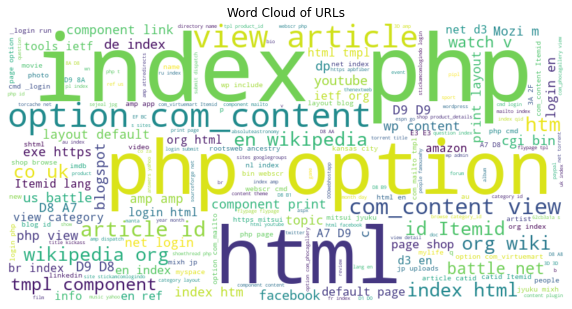

In [122]:
# Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(data['url']))
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of URLs')
plt.show()

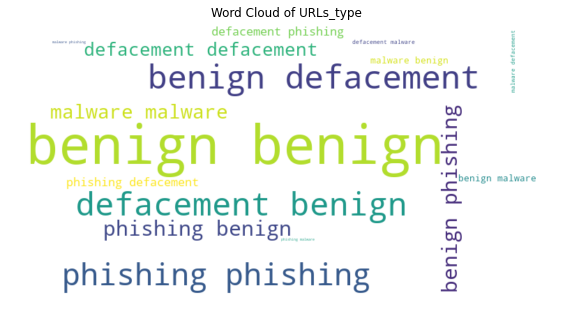

In [123]:
# Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(data['type']))
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of URLs_type')
plt.show()

In [124]:
data

,url,type,url_type,use_of_ip,abnormal_url,google_index,count.,count-www,count@,count_dir,...,count?,count-,count=,url_length,hostname_length,sus_url,fd_length,tld_length,count-digits,count-letters
0,br-icloud.com.br,phishing,2,0,0,1,2,0,0,0,...,0,1,0,16,0,0,0,-1,0,13
1,mp3raid.com/music/krizz_kaliko.html,benign,0,0,0,1,2,0,0,2,...,0,0,0,35,0,0,5,-1,1,29
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,0,0,1,2,0,0,3,...,0,0,0,31,0,0,7,-1,1,25
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,0,1,1,2,0,0,1,...,1,1,4,84,17,0,9,2,7,60
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,0,1,1,2,0,0,1,...,1,1,3,235,23,0,9,3,22,199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
651186,xbox360.ign.com/objects/850/850402.html,phishing,2,0,0,1,3,0,0,3,...,0,0,0,39,0,0,7,-1,12,21
651187,games.teamxbox.com/xbox-360/1860/Dead-Space/,phishing,2,0,0,1,2,0,0,4,...,0,2,0,44,0,0,8,-1,7,29
651188,gamespot.com/xbox360/action/deadspace/,phishing,2,0,0,1,1,0,0,4,...,0,0,0,38,0,0,7,-1,3,30
651189,en.wikipedia.org/wiki/Dead_Space_(video_game),phishing,2,0,0,1,2,0,0,2,...,0,0,0,45,0,0,4,-1,0,36


In [125]:
data.head()

,url,type,url_type,use_of_ip,abnormal_url,google_index,count.,count-www,count@,count_dir,...,count?,count-,count=,url_length,hostname_length,sus_url,fd_length,tld_length,count-digits,count-letters
0,br-icloud.com.br,phishing,2,0,0,1,2,0,0,0,...,0,1,0,16,0,0,0,-1,0,13
1,mp3raid.com/music/krizz_kaliko.html,benign,0,0,0,1,2,0,0,2,...,0,0,0,35,0,0,5,-1,1,29
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,0,0,1,2,0,0,3,...,0,0,0,31,0,0,7,-1,1,25
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,0,1,1,2,0,0,1,...,1,1,4,84,17,0,9,2,7,60
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,0,1,1,2,0,0,1,...,1,1,3,235,23,0,9,3,22,199


In [126]:
#Histogram
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Histogram(x=data['url_length'], nbinsx=100))

fig.update_layout(
    title='Distribution of URL Lengths',
    xaxis_title='URL Length',
    yaxis_title='Count',
    template='plotly_dark',
    font=dict(color='white')
)

fig.show()

In [127]:
# Bar chart for 'type' column
type_counts = data['hostname_length'].value_counts()
fig = go.Figure(data=[go.Bar(x=type_counts.index, y=type_counts.values)])
fig.update_layout(title='Frequency of hostname length',
                  xaxis_title='Hostname Length',
                  yaxis_title='Count',
                  template='plotly_dark',
                  font=dict(color='white'),
                  showlegend=False)
fig.show()

In [128]:
# Pie chart for 'url_type' column
url_type_counts = data['count-digits'].value_counts()
fig = go.Figure(data=[go.Pie(labels=url_type_counts.index, values=url_type_counts.values)])
fig.update_layout(title='Distribution of URL Types',
                  template='plotly_dark',
                  font=dict(color='white'),
                  showlegend=True)
fig.show()

In [129]:
counts = data[['count-digits', 'count-letters', 'count-https']].sum()

fig = go.Figure(data=[
    go.Bar(name='Letters', x=['Count'], y=[counts['count-letters']]),
    go.Bar(name='Digits', x=['Count'], y=[counts['count-digits']]),
    go.Bar(name='HTTPs', x=['Count'], y=[counts['count-https']])
])

fig.update_layout(title='Counts of Letters, Digits, and HTTPs',
                  xaxis_title='Type',
                  yaxis_title='Count',
                  barmode='group',
                  template='plotly_dark',
                  font=dict(color='white'))

fig.show()

In [130]:
true_color = 'green'

false_color = 'red'

google_index_counts = data['google_index'].value_counts()
colors = [true_color if val else false_color for val in google_index_counts.index]
fig_google_index = go.Figure(data=go.Bar(x=google_index_counts.index, y=google_index_counts, marker_color=colors))
fig_google_index.update_layout(title='Counts of google_index',
                            xaxis_title='Value',
                            yaxis_title='Count',
                            template='plotly_dark',
                            font=dict(color='white'))
fig_google_index.show()

abnormal_url_counts = data['abnormal_url'].value_counts()
colors = [true_color if val else false_color for val in abnormal_url_counts.index]
fig_abnormal_url = go.Figure(data=go.Bar(x=abnormal_url_counts.index, y=abnormal_url_counts, marker_color=colors))
fig_abnormal_url.update_layout(title='Counts of abnormal_url',
                               xaxis_title='Value',
                               yaxis_title='Count',
                               template='plotly_dark',
                               font=dict(color='white'))
fig_abnormal_url.show()

fd_length_counts = data['fd_length'].value_counts()
colors = [true_color if val else false_color for val in fd_length_counts.index]
fig_fd_length = go.Figure(data=go.Bar(x=fd_length_counts.index, y=fd_length_counts, marker_color=colors))
fig_fd_length.update_layout(title='Counts of fd_length',
                              xaxis_title='Value',
                              yaxis_title='Count',
                              template='plotly_dark',
                              font=dict(color='white'))
fig_fd_length.show()

tld_length_counts = data['tld_length'].value_counts()
colors = [true_color if val else false_color for val in tld_length_counts.index]
fig_tld_length = go.Figure(data=go.Bar(x=tld_length_counts.index, y=tld_length_counts, marker_color=colors))
fig_tld_length.update_layout(title='Counts of tld_length',
                          xaxis_title='Value',
                          yaxis_title='Count',
                          template='plotly_dark',
                          font=dict(color='white'))
fig_tld_length.show()


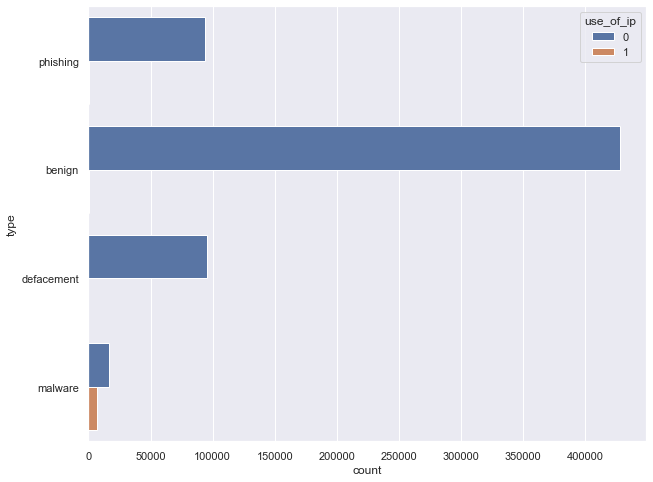

In [132]:
sns.set(style="darkgrid")
plt.figure(figsize=(10, 8))
ax = sns.countplot(y="type", data=data,hue="use_of_ip")
plt.show()

Text(0.5, 1.0, 'Full Length Domain Length')

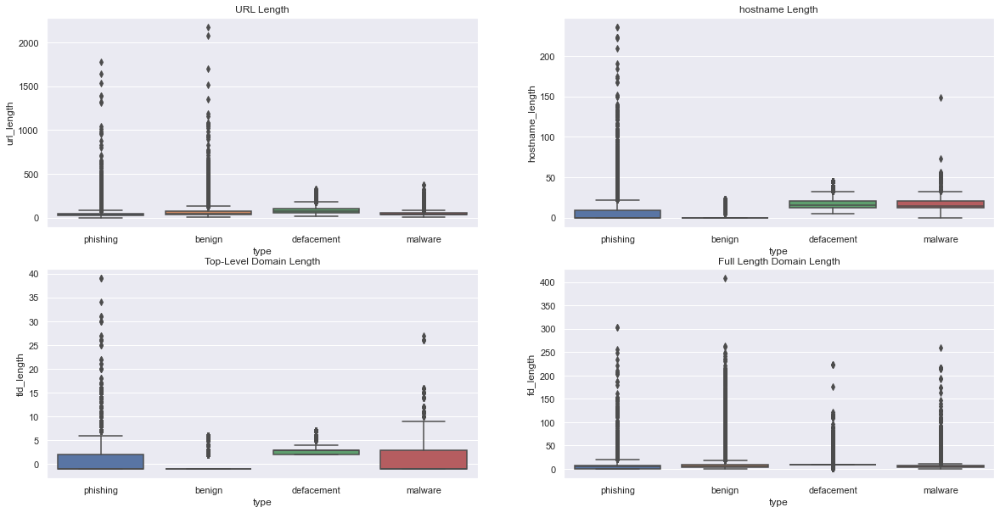

In [134]:
fig, axes = plt.subplots(2,2, figsize=(20, 10), sharey=False)
sns.boxplot(ax=axes[0, 0], x='type', y='url_length', data=data)
axes[0, 0].set_title('URL Length')
sns.boxplot(ax=axes[0, 1], x='type', y='hostname_length', data=data)
axes[0, 1].set_title('hostname Length')
sns.boxplot(ax=axes[1, 0], x='type', y='tld_length', data=data)
axes[1, 0].set_title('Top-Level Domain Length')
sns.boxplot(ax=axes[1, 1], x='type', y='fd_length', data=data)
axes[1, 1].set_title('Full Length Domain Length')

# Correlation Plot: HeatMap 

In [135]:
numeric_data = data.select_dtypes(include='number')

corr_matrix = numeric_data.corr()

heatmap = go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='PiYg',  
)


layout = go.Layout(
    title='Correlation Heatmap (Numeric Values Only)',
    xaxis=dict(title='Variables'),
    yaxis=dict(title='Variables'),
    plot_bgcolor='black', 
    paper_bgcolor='black', 
    font=dict(color='white')  
)


fig = go.Figure(data=heatmap, layout=layout)


fig.show()

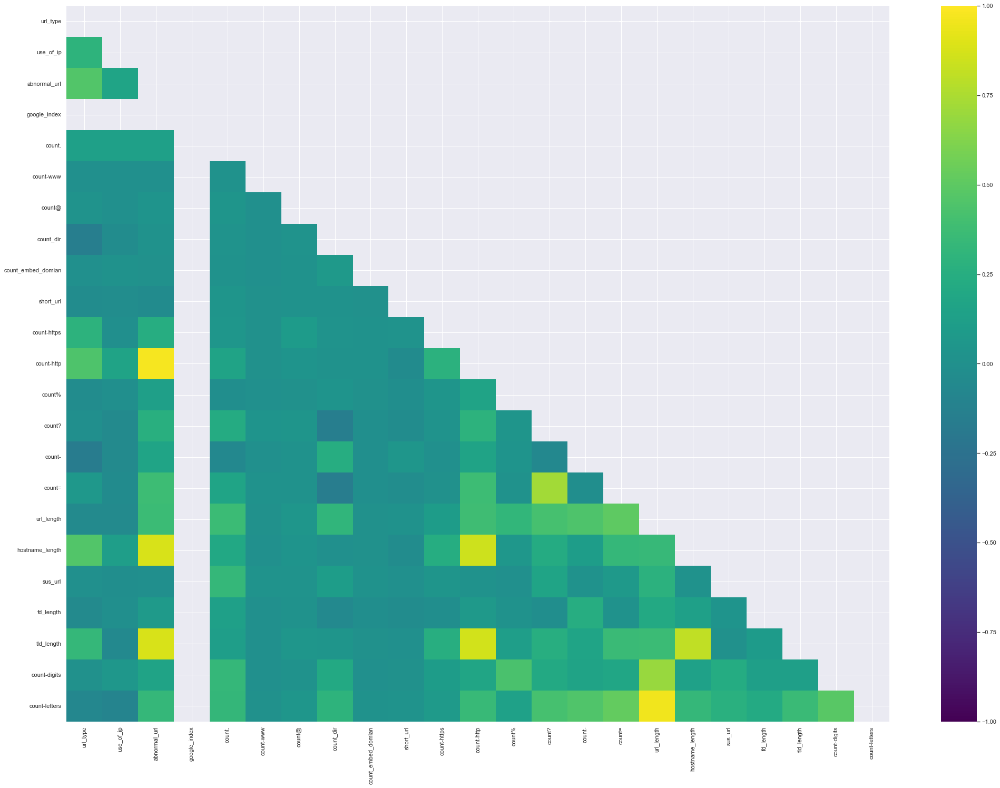

In [136]:
# Select only numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# Compute the correlation matrix
corr = numeric_data.corr()

# Plot the heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(35, 25))
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, annot=True, cmap='viridis')
plt.show()


In [138]:
data = data.drop(['url','type'],axis=1)

In [139]:
data

,url_type,use_of_ip,abnormal_url,google_index,count.,count-www,count@,count_dir,count_embed_domian,short_url,...,count?,count-,count=,url_length,hostname_length,sus_url,fd_length,tld_length,count-digits,count-letters
0,2,0,0,1,2,0,0,0,0,0,...,0,1,0,16,0,0,0,-1,0,13
1,0,0,0,1,2,0,0,2,0,0,...,0,0,0,35,0,0,5,-1,1,29
2,0,0,0,1,2,0,0,3,0,0,...,0,0,0,31,0,0,7,-1,1,25
3,1,0,1,1,2,0,0,1,0,0,...,1,1,4,84,17,0,9,2,7,60
4,1,0,1,1,2,0,0,1,0,0,...,1,1,3,235,23,0,9,3,22,199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
651186,2,0,0,1,3,0,0,3,0,0,...,0,0,0,39,0,0,7,-1,12,21
651187,2,0,0,1,2,0,0,4,0,1,...,0,2,0,44,0,0,8,-1,7,29
651188,2,0,0,1,1,0,0,4,0,1,...,0,0,0,38,0,0,7,-1,3,30
651189,2,0,0,1,2,0,0,2,0,0,...,0,0,0,45,0,0,4,-1,0,36


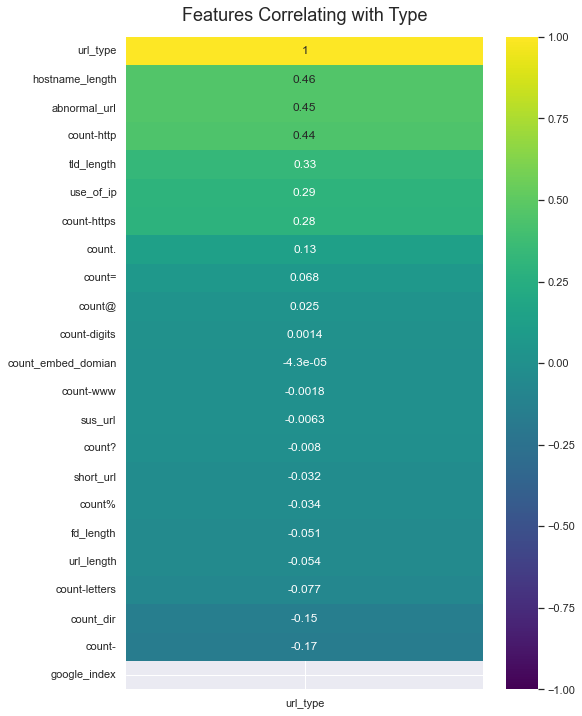

In [140]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(data.corr()[['url_type']].sort_values(by='url_type', ascending=False), vmin=-1, vmax=1, annot=True, cmap = 'viridis')
heatmap.set_title('Features Correlating with Type', fontdict={'fontsize':18}, pad=16);
plt.savefig('heatmapfeaturecorr.png', dpi=300, bbox_inches='tight')

In [141]:
#Splitting Data
X = data.drop('url_type', axis = 1)
y = data['url_type']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=5)

# Features Selection 

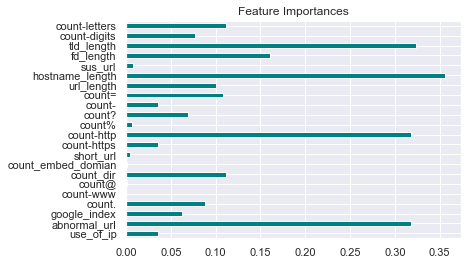

In [147]:
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
importances = mutual_info_classif(X_train, y_train)
feat_importances = pd.Series(importances, X_train.columns)
threshold = 0.01
feat_importances.plot(kind='barh', color='teal')
plt.title('Feature Importances')
plt.show()

In [148]:
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100,max_features='sqrt')
rf.fit(X_train,y_train)
y_pred_rf = rf.predict(X_test)
print(classification_report(y_test,y_pred_rf,target_names=['benign', 'defacement','phishing','malware']))

score = metrics.accuracy_score(y_test, y_pred_rf)
print("accuracy:   %0.3f" % score)

              precision    recall  f1-score   support

      benign       0.94      0.97      0.96     85839
  defacement       0.98      0.99      0.98     18885
    phishing       0.83      0.72      0.77     18730
     malware       0.98      0.90      0.94      4771

    accuracy                           0.94    128225
   macro avg       0.93      0.90      0.91    128225
weighted avg       0.93      0.94      0.93    128225

accuracy:   0.935


In [149]:
# Number of top features to select
k = 10

# Use SelectKBest to select the top k features
selector = SelectKBest(score_func=mutual_info_classif, k=k)
X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)

# Get the names of selected features
selected_features = X_train.columns[selector.get_support()]
print(f"Top {k} features:")
print(selected_features)


Top 10 features:
Index(['abnormal_url', 'count.', 'count_dir', 'count-http', 'count=',
       'url_length', 'hostname_length', 'fd_length', 'tld_length',
       'count-letters'],
      dtype='object')


In [150]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming selected_features contains the top 10 feature names
top_features = ['abnormal_url', 'count.', 'count_dir', 'count-http', 'count=',
                'url_length', 'hostname_length', 'fd_length', 'tld_length',
                'count-letters']

# Filter the datasets to include only the top features
X_train_selected = X_train[top_features]
X_test_selected = X_test[top_features]

# Initialize the Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train_selected, y_train)

# Make predictions
y_pred = rf_model.predict(X_test_selected)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))




Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96     85839
           1       0.97      0.99      0.98     18885
           2       0.81      0.69      0.75     18730
           3       0.98      0.89      0.93      4771

    accuracy                           0.93    128225
   macro avg       0.92      0.89      0.90    128225
weighted avg       0.93      0.93      0.93    128225



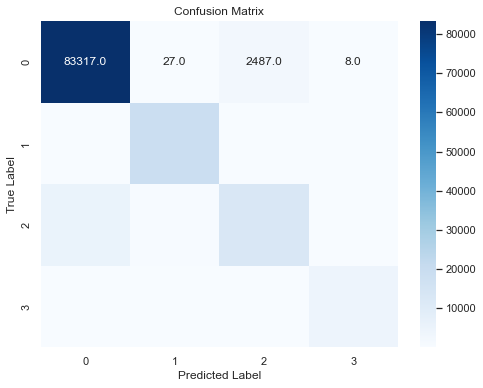

In [152]:


# Plot confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='.1f', cmap='Blues', xticklabels=rf_model.classes_, yticklabels=rf_model.classes_)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


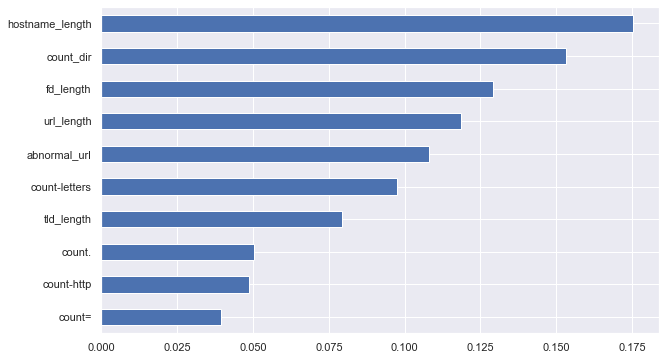

In [153]:
feat_importances = pd.Series(rf_model.feature_importances_, index=X_train_selected.columns)
feat_importances.sort_values().plot(kind="barh",figsize=(10, 6))
plt.show()

In [156]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [1]:
from lightgbm import LGBMClassifier
lgb = LGBMClassifier(objective='multiclass',boosting_type= 'gbdt',n_jobs = 5, 
          silent = True, random_state=5)
LGB_C = lgb.fit(X_train, y_train)


y_pred_lgb = LGB_C.predict(X_test)
print(classification_report(y_test,y_pred_lgb,target_names=['benign', 'defacement','phishing','malware']))

score = metrics.accuracy_score(y_test, y_pred_lgb)
print("accuracy:   %0.3f" % score)

AttributeError: module 'pandas.core.strings' has no attribute 'StringMethods'